In [7]:
#7 microphone channels for sound data with varying base frequencies.
# 15 accelerometer channels (5 accelerometers × 3 axes: x, y, z).
# Data acquisition at 0.5-second intervals for 15 minutes.
# Includes realistic noise to mimic real-world variability.
import numpy as np
import pandas as pd
# Constants
num_microphones = 7
num_accelerometers = 5
axes_per_accelerometer = 3  # x, y, z
total_sensors = num_microphones + (num_accelerometers * axes_per_accelerometer)
sampling_interval = 0.5  # seconds
frequency_range = (1, 500)  # Hz
duration_minutes = 15
duration_seconds = duration_minutes * 60

# Time vector
time_points = np.arange(0, duration_seconds, sampling_interval)
# Simulate NVH data
def generate_signal(time_points, base_frequency, noise_level=0.05):
    """Generates synthetic NVH data with a base frequency and added noise."""
    signal = np.sin(2 * np.pi * base_frequency * time_points)
    noise = noise_level * np.random.randn(len(time_points))
    return signal + noise
# Generate data for microphones (sound signals)
microphone_data = {f'mic_{i+1}': generate_signal(time_points, base_frequency=50 + i*10) for i in range(num_microphones)}
# Generate data for accelerometers (vibration signals in x, y, z)
accelerometer_data = {}
for i in range(num_accelerometers):
    for axis in ['x', 'y', 'z']:
        channel_name = f'acc_{i+1}_{axis}'
        base_frequency = 30 + (i * 5) + (5 if axis == 'z' else 0)  # Slight variation per axis
        accelerometer_data[channel_name] = generate_signal(time_points, base_frequency)

# Combine all data into a DataFrame
data = {**microphone_data, **accelerometer_data}
data['time'] = time_points

df = pd.DataFrame(data)

# Save the synthesized dataset
df.to_csv('exact_synthesized_nvh_data.csv', index=False)
df

,mic_1,mic_2,mic_3,mic_4,mic_5,mic_6,mic_7,acc_1_x,acc_1_y,acc_1_z,...,acc_3_x,acc_3_y,acc_3_z,acc_4_x,acc_4_y,acc_4_z,acc_5_x,acc_5_y,acc_5_z,time
0,-0.050655,-0.041878,0.109140,0.005006,0.047129,0.004966,0.054151,0.039918,0.002503,0.027062,...,0.047708,0.091104,0.055093,0.077756,-0.004237,0.076793,-0.066470,0.024657,0.076076,0.0
1,0.063360,-0.013345,0.047170,-0.000035,-0.032200,-0.075288,0.010262,0.049112,-0.048766,0.029500,...,-0.025275,0.076404,0.042091,-0.083865,-0.014395,0.052372,-0.048000,-0.008329,-0.047383,0.5
2,-0.017089,-0.037833,-0.035251,-0.035561,-0.088333,0.022150,0.008343,0.037932,0.046479,0.007081,...,-0.007644,-0.006181,-0.053157,0.005670,0.001287,0.009671,0.001063,-0.020202,0.032257,1.0
3,0.076628,-0.057802,-0.036395,-0.006649,0.013044,-0.042386,-0.016724,-0.052939,-0.037620,0.045614,...,0.015259,0.012409,0.091495,0.007149,0.000152,0.053481,0.081124,0.022607,-0.010406,1.5
4,0.089978,-0.027229,0.038408,0.046805,0.047089,0.038939,-0.013269,0.013060,0.011039,0.003714,...,-0.011489,0.109771,-0.095265,0.025981,-0.008665,-0.003738,-0.055957,-0.003352,-0.036396,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1795,0.010420,0.000119,-0.093843,0.040922,-0.000211,-0.039175,-0.046180,-0.062724,-0.084904,0.014001,...,0.081488,-0.051538,-0.005996,-0.014598,-0.091673,-0.024230,0.022939,0.043690,0.059457,897.5
1796,-0.043548,0.050186,-0.007616,-0.031149,-0.015573,0.005131,-0.013792,0.017917,-0.006127,0.047005,...,0.035110,0.030199,0.081005,0.038116,0.067408,0.007288,-0.011165,0.081401,-0.010789,898.0
1797,0.085835,-0.014702,-0.086896,-0.015623,-0.002035,0.039385,0.091353,-0.076329,0.020375,0.017363,...,-0.026090,-0.027373,-0.068262,-0.042109,-0.013574,-0.002097,-0.007359,-0.037190,0.004372,898.5
1798,0.065025,0.038593,-0.014454,-0.080134,0.014456,0.063361,0.008459,0.005089,0.029087,0.030890,...,-0.029348,0.042997,-0.101432,-0.007259,0.072016,-0.145932,0.031226,-0.000684,0.037236,899.0


<Figure size 1500x1000 with 0 Axes>

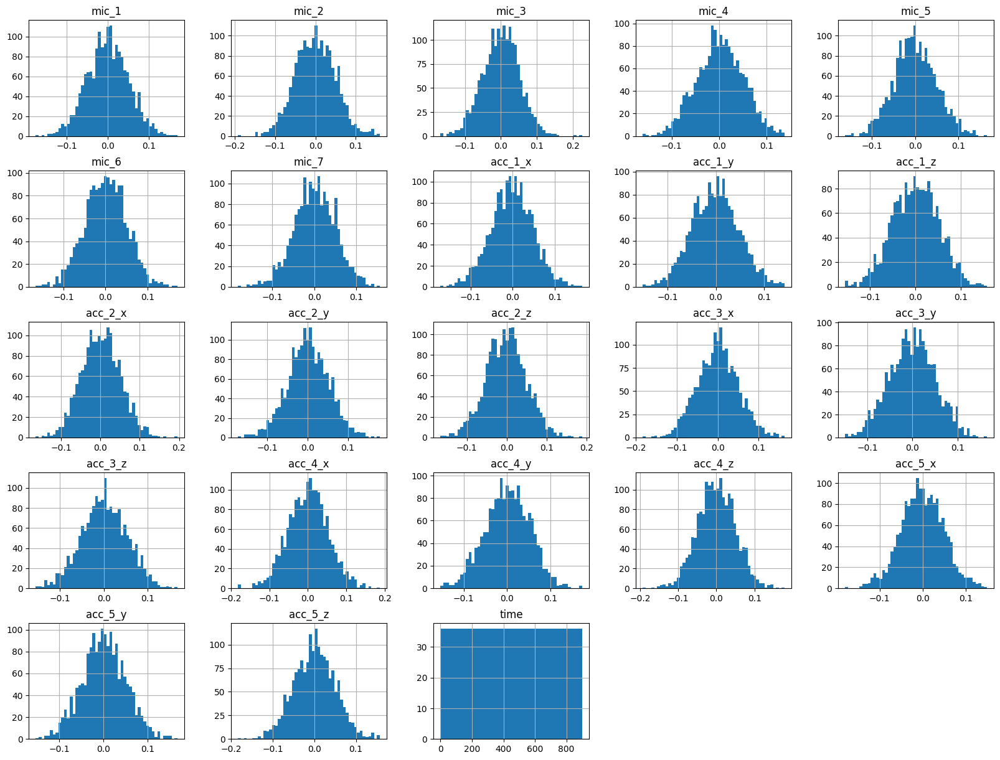

In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr, normaltest
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
# Exploratory Data Analysis (EDA)
plt.figure(figsize=(15, 10))
df.hist(bins=50, figsize=(20, 15))
plt.show()


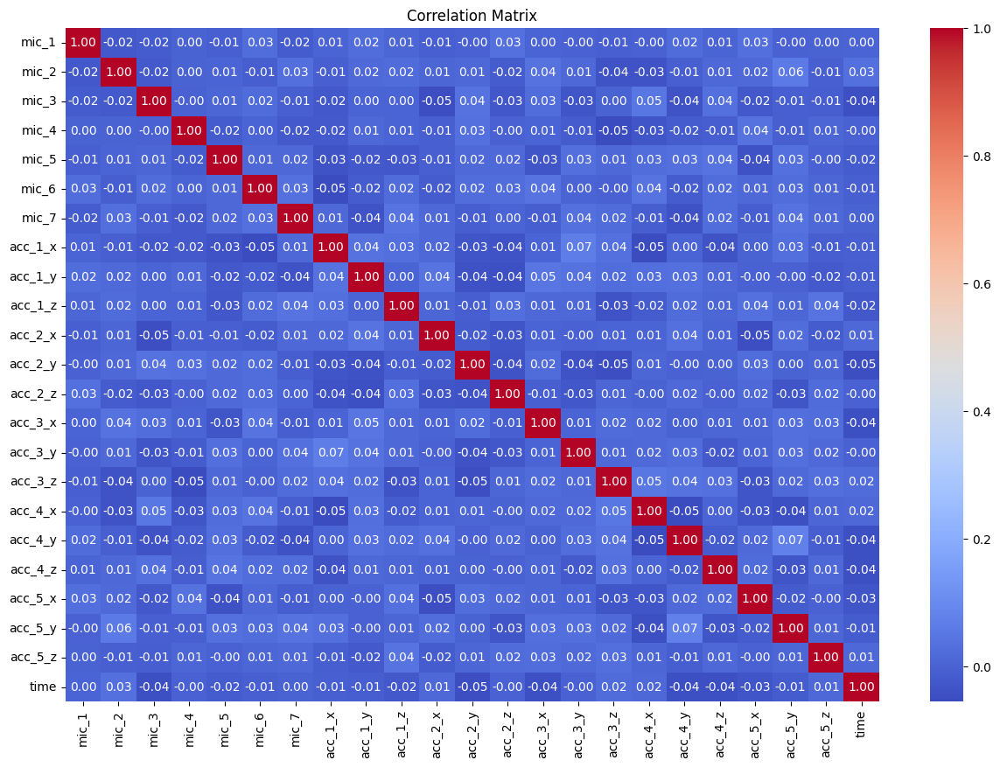

In [10]:
# Correlation Matrix
corr_matrix = df.corr()
plt.figure(figsize=(15, 10))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

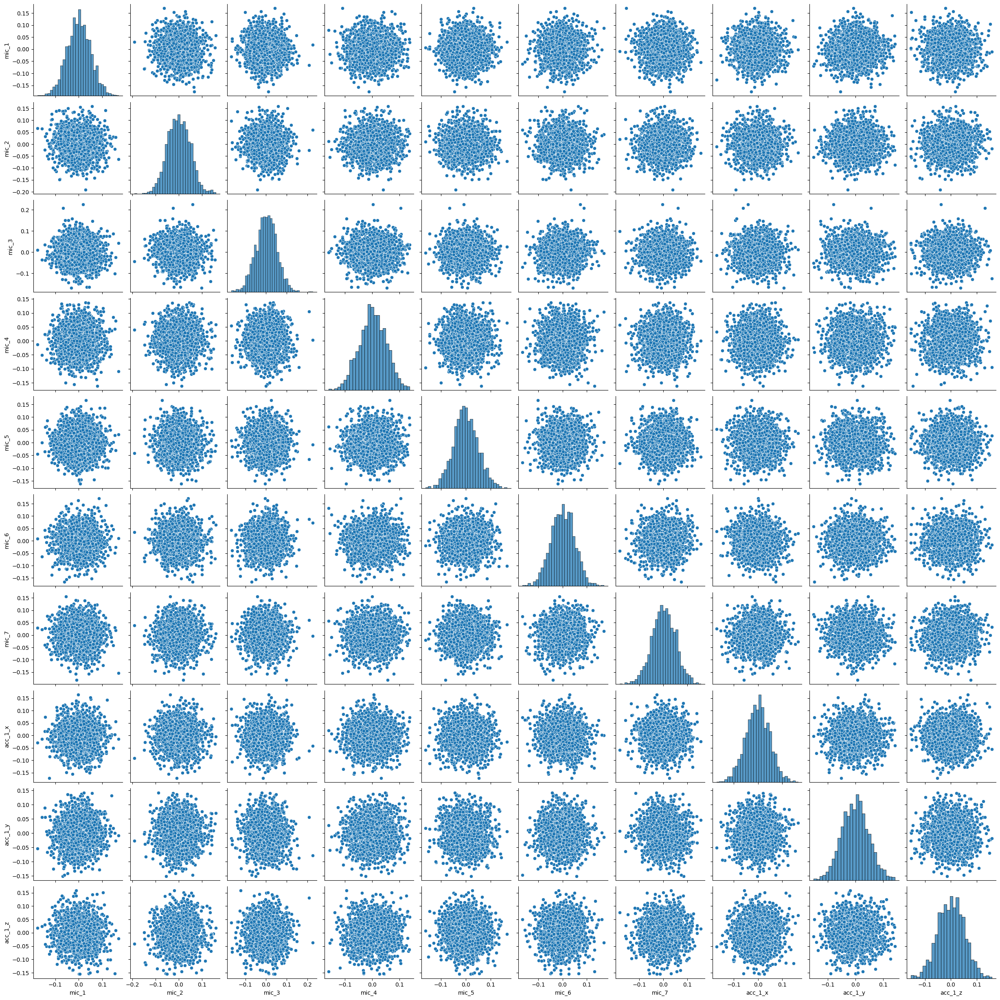

In [11]:
# Pair Plot for selected features
selected_features = df.columns[:10]  # Select first 10 features for visualization
sns.pairplot(df[selected_features])
plt.show()

In [12]:
# Variable Importance Analysis using Random Forest
X = df.drop(columns=['mic_1'])  # Assume 'mic_1' as the target for demonstration
y = df['mic_1']

In [13]:
rf = RandomForestRegressor(n_estimators=500, random_state=42)
rf.fit(X, y)

RandomForestRegressor(n_estimators=500, random_state=42)

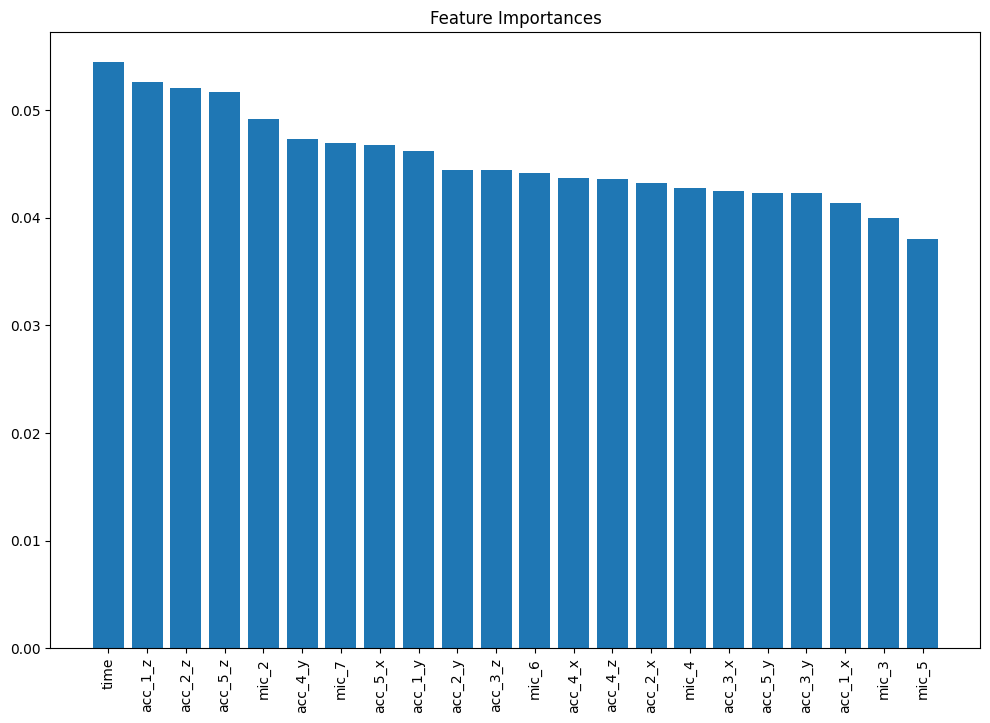

In [14]:
importances = rf.feature_importances_
indices = np.argsort(importances)[::-1]

plt.figure(figsize=(12, 8))
plt.title('Feature Importances')
plt.bar(range(X.shape[1]), importances[indices], align='center')
plt.xticks(range(X.shape[1]), X.columns[indices], rotation=90)
plt.show()


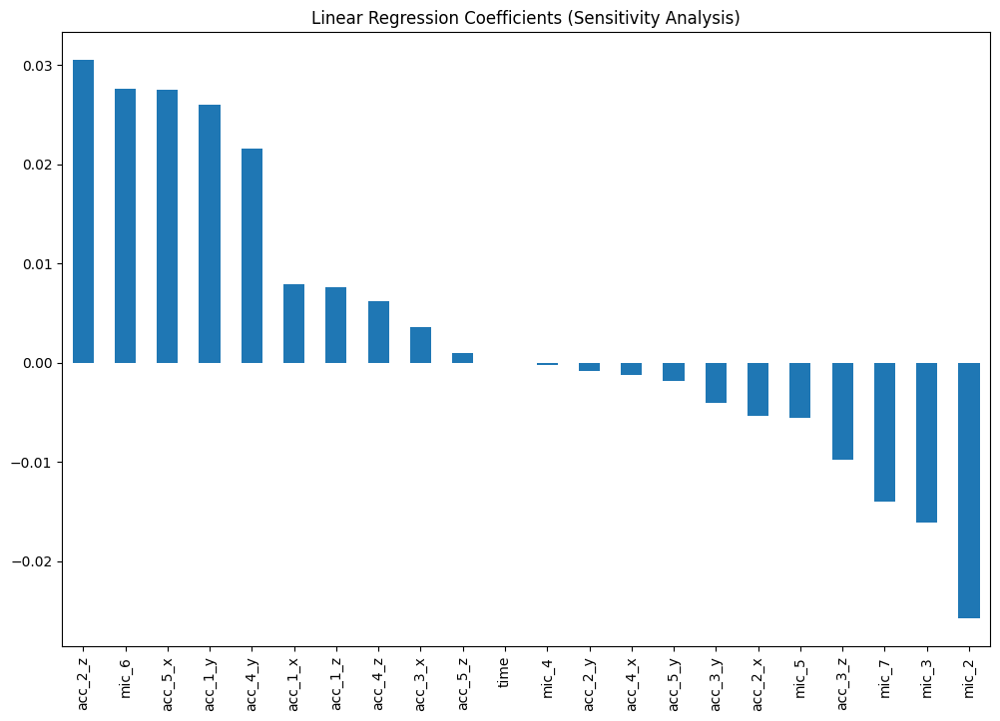

In [15]:
# Linear Regression for Sensitivity Analysis
lin_reg = LinearRegression()
lin_reg.fit(X, y)

# Coefficients and Sensitivity
coefficients = pd.Series(lin_reg.coef_, index=X.columns)
coefficients.sort_values(ascending=False, inplace=True)

plt.figure(figsize=(12, 8))
coefficients.plot(kind='bar')
plt.title('Linear Regression Coefficients (Sensitivity Analysis)')
plt.show()

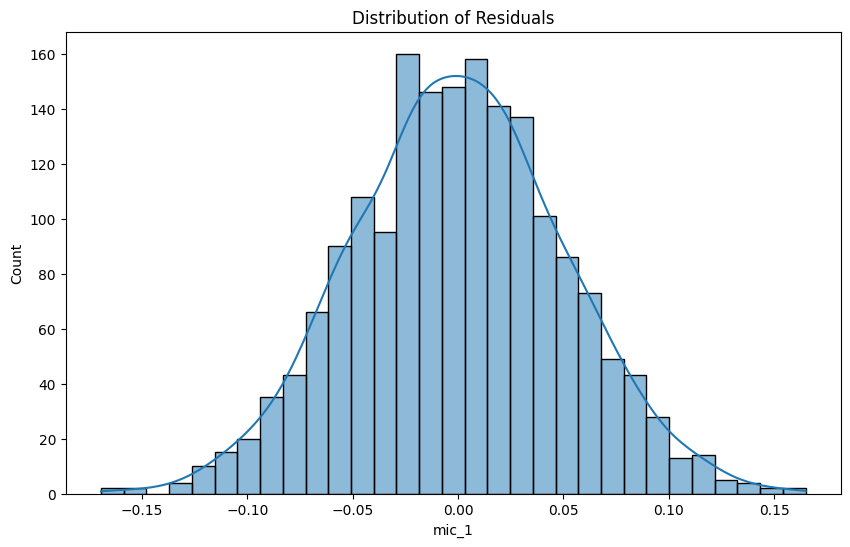

In [16]:
# Normality Test of Residuals
predictions = lin_reg.predict(X)
residuals = y - predictions

plt.figure(figsize=(10, 6))
sns.histplot(residuals, kde=True)
plt.title('Distribution of Residuals')
plt.show()


In [17]:
stat, p_value = normaltest(residuals)
print(f'Normality Test Statistic: {stat}, p-value: {p_value}')

Normality Test Statistic: 0.17925848266525257, p-value: 0.9142700960027139


In [19]:
# Scatter Plot for Highly Correlated Variables
high_corr_features = corr_matrix['mic_1'][corr_matrix['mic_1'].abs() > 0.7].index.tolist()

for feature in high_corr_features:
    if feature != 'mic_1':
        plt.figure(figsize=(8, 6))
        sns.scatterplot(x=df[feature], y=df['mic_1'])
        plt.title(f'Scatter Plot between mic_1 and {feature}')
        plt.show()

# Save the correlation matrix
corr_matrix.to_csv('correlation_matrix.csv')
corr_matrix

,mic_1,mic_2,mic_3,mic_4,mic_5,mic_6,mic_7,acc_1_x,acc_1_y,acc_1_z,...,acc_3_x,acc_3_y,acc_3_z,acc_4_x,acc_4_y,acc_4_z,acc_5_x,acc_5_y,acc_5_z,time
mic_1,1.000000,-0.024616,-0.017126,0.001633,-0.006950,0.026695,-0.015409,0.006206,0.023955,0.010173,...,0.004468,-0.003128,-0.008302,-0.002279,0.023512,0.005017,0.029229,-0.003268,0.001492,0.003895
mic_2,-0.024616,1.000000,-0.021280,0.002066,0.006663,-0.010137,0.030942,-0.006556,0.019553,0.019792,...,0.036808,0.011591,-0.037676,-0.034925,-0.007256,0.013604,0.017993,0.058617,-0.007485,0.034177
mic_3,-0.017126,-0.021280,1.000000,-0.004866,0.009437,0.022623,-0.005554,-0.023734,0.003273,0.003427,...,0.027704,-0.032069,0.002131,0.051197,-0.035274,0.035089,-0.022464,-0.007018,-0.012963,-0.043005
mic_4,0.001633,0.002066,-0.004866,1.000000,-0.016503,0.004406,-0.020989,-0.017564,0.013138,0.005195,...,0.005381,-0.013508,-0.051809,-0.031824,-0.017321,-0.009843,0.036741,-0.006980,0.008932,-0.003897
mic_5,-0.006950,0.006663,0.009437,-0.016503,1.000000,0.012989,0.015066,-0.034328,-0.022844,-0.027634,...,-0.033314,0.029643,0.014288,0.025770,0.028263,0.042090,-0.040632,0.033812,-0.002712,-0.015268
mic_6,0.026695,-0.010137,0.022623,0.004406,0.012989,1.000000,0.032645,-0.053621,-0.015079,0.020622,...,0.041647,0.004037,-0.003353,0.040588,-0.016532,0.024194,0.012058,0.027402,0.011332,-0.005501
mic_7,-0.015409,0.030942,-0.005554,-0.020989,0.015066,0.032645,1.000000,0.014655,-0.035915,0.042436,...,-0.012230,0.035425,0.023651,-0.011544,-0.039376,0.024187,-0.010561,0.039130,0.013361,0.000206
acc_1_x,0.006206,-0.006556,-0.023734,-0.017564,-0.034328,-0.053621,0.014655,1.000000,0.038916,0.029908,...,0.005787,0.067468,0.035752,-0.051513,0.003370,-0.035114,0.000315,0.028358,-0.010741,-0.005619
acc_1_y,0.023955,0.019553,0.003273,0.013138,-0.022844,-0.015079,-0.035915,0.038916,1.000000,0.003320,...,0.046467,0.040011,0.024177,0.029574,0.032736,0.011535,-0.001020,-0.002779,-0.018830,-0.011665
acc_1_z,0.010173,0.019792,0.003427,0.005195,-0.027634,0.020622,0.042436,0.029908,0.003320,1.000000,...,0.014466,0.014380,-0.034929,-0.016866,0.023368,0.008276,0.036034,0.009703,0.041091,-0.024207


In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr, normaltest
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

# Set plot style for research article
plt.style.use('ggplot')
sns.set_context('talk', font_scale=1.5)
# Load the dataset
df = pd.read_csv('exact_synthesized_nvh_data.csv')

<Figure size 2000x1500 with 0 Axes>

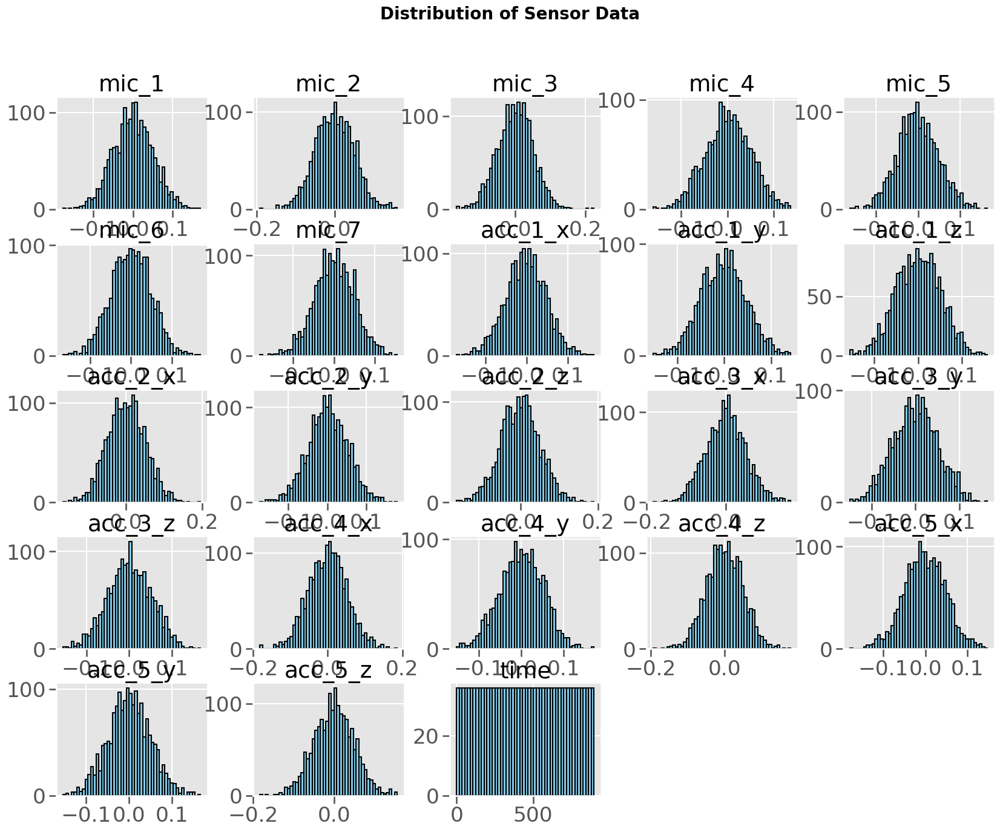

In [5]:

# Exploratory Data Analysis (EDA)
plt.figure(figsize=(20, 15))
df.hist(bins=50, figsize=(20, 15), color='skyblue', edgecolor='black')
plt.suptitle('Distribution of Sensor Data', fontsize=20, fontweight='bold')
plt.show()

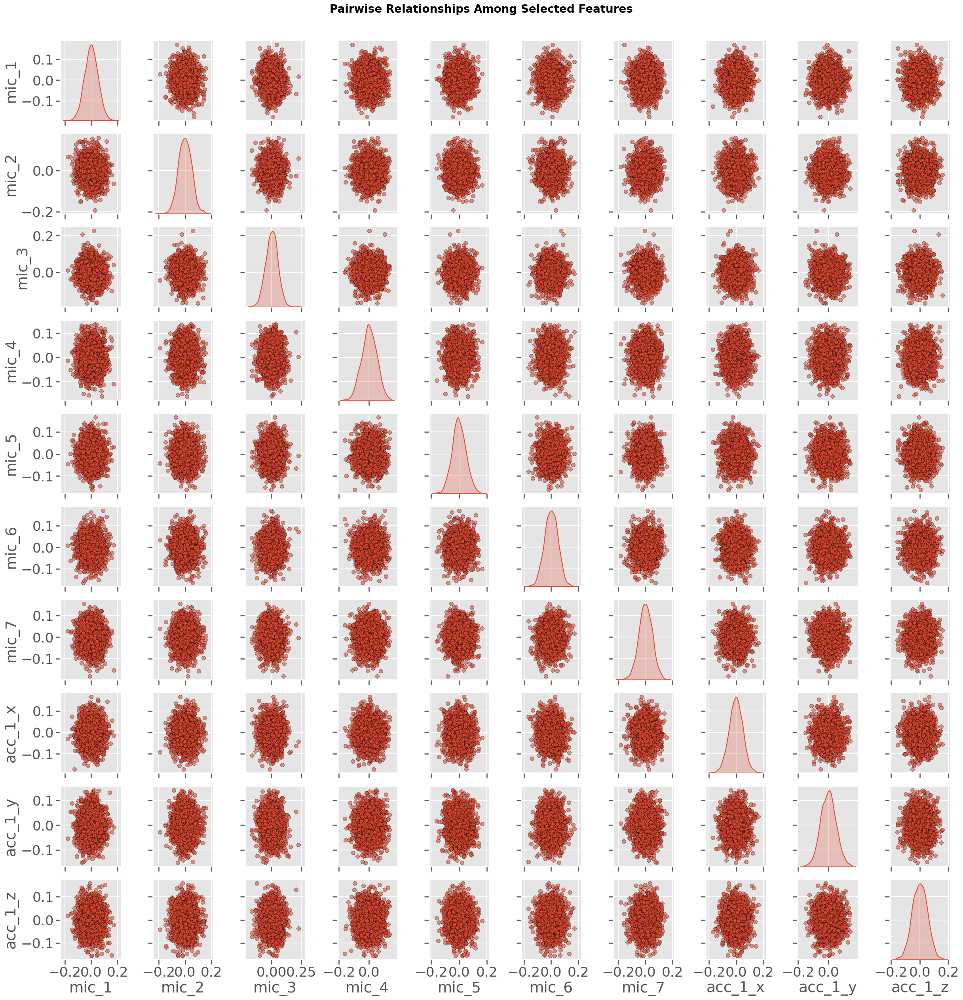

In [6]:
# Pair Plot for selected features
selected_features = df.columns[:10]  # Select first 10 features for visualization
sns.pairplot(df[selected_features], diag_kind='kde', plot_kws={'alpha': 0.6, 's': 50, 'edgecolor': 'k'})
plt.suptitle('Pairwise Relationships Among Selected Features', y=1.02, fontsize=20, fontweight='bold')
plt.show()

In [7]:
# Variable Importance Analysis using Random Forest
X = df.drop(columns=['mic_1'])  # Assume 'mic_1' as the target for demonstration
y = df['mic_1']

rf = RandomForestRegressor(n_estimators=500, random_state=42)
rf.fit(X, y)

RandomForestRegressor(n_estimators=500, random_state=42)

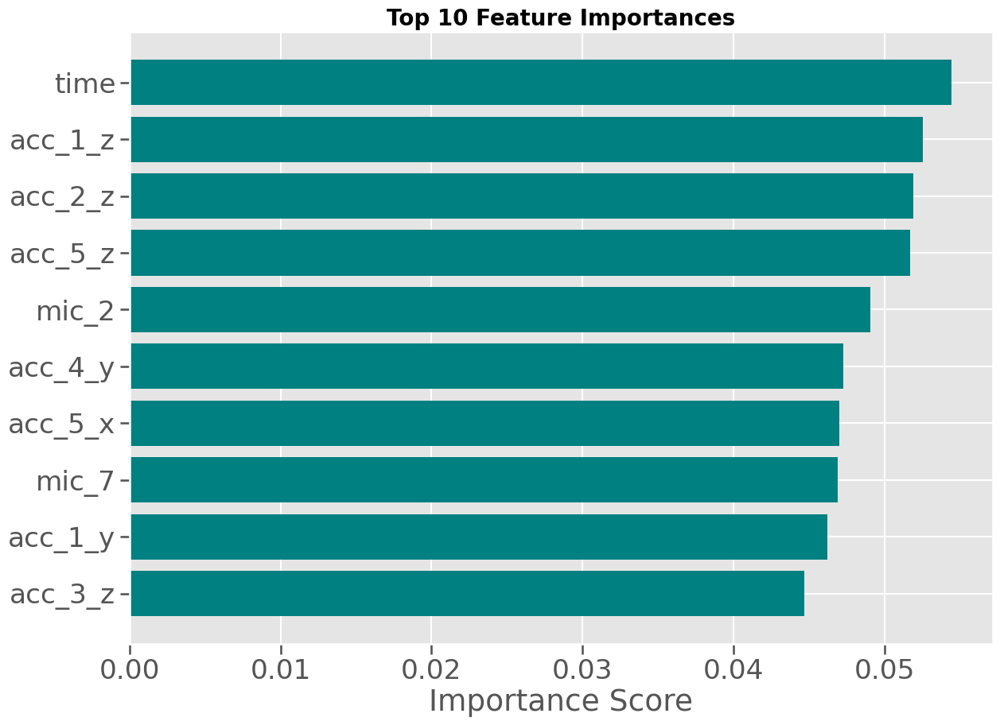

In [8]:
importances = rf.feature_importances_
indices = np.argsort(importances)[::-1]

plt.figure(figsize=(14, 10))
plt.title('Top 10 Feature Importances', fontsize=20, fontweight='bold')
plt.barh(X.columns[indices[:10]], importances[indices[:10]], color='teal')
plt.gca().invert_yaxis()
plt.xlabel('Importance Score')
plt.show()

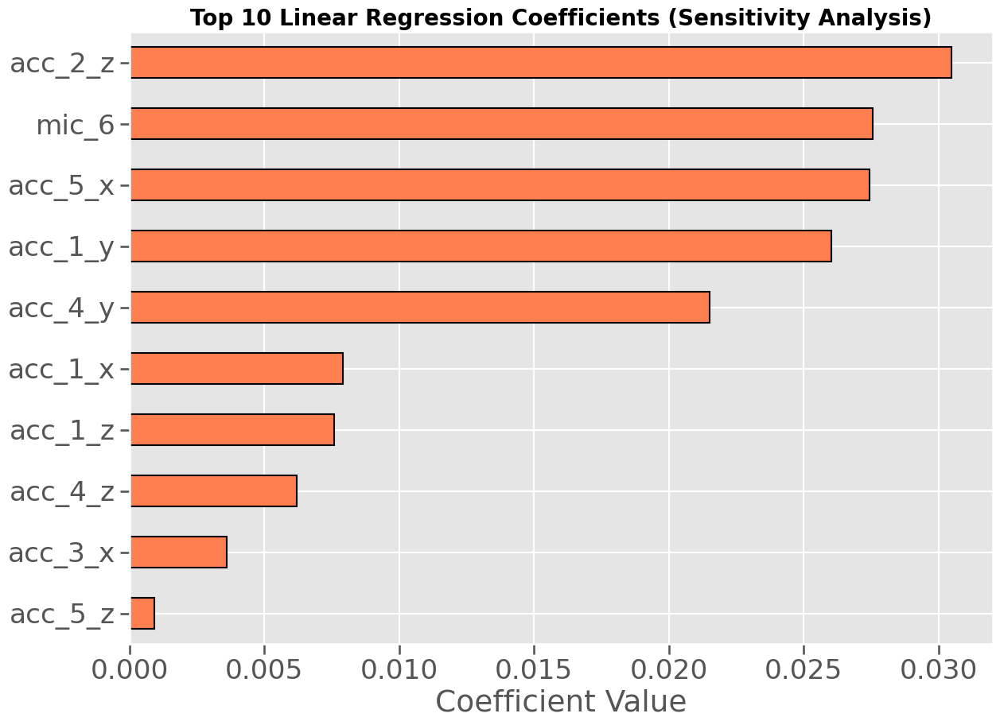

In [9]:
# Linear Regression for Sensitivity Analysis
lin_reg = LinearRegression()
lin_reg.fit(X, y)

# Coefficients and Sensitivity
coefficients = pd.Series(lin_reg.coef_, index=X.columns)
coefficients.sort_values(ascending=False, inplace=True)

plt.figure(figsize=(14, 10))
coefficients.head(10).plot(kind='barh', color='coral', edgecolor='black')
plt.title('Top 10 Linear Regression Coefficients (Sensitivity Analysis)', fontsize=20, fontweight='bold')
plt.xlabel('Coefficient Value')
plt.gca().invert_yaxis()
plt.show()

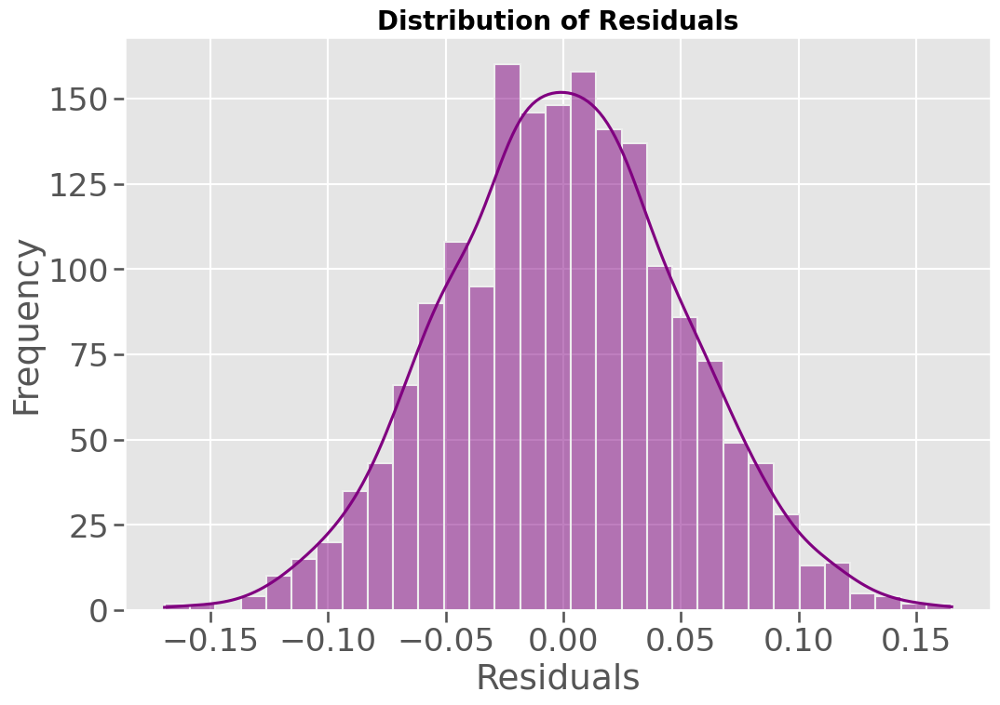

In [10]:
# Normality Test of Residuals
predictions = lin_reg.predict(X)
residuals = y - predictions

plt.figure(figsize=(12, 8))
sns.histplot(residuals, kde=True, color='purple')
plt.title('Distribution of Residuals', fontsize=20, fontweight='bold')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.show()


In [11]:
stat, p_value = normaltest(residuals)
print(f'Normality Test Statistic: {stat:.4f}, p-value: {p_value:.4e}')


Normality Test Statistic: 0.1793, p-value: 9.1427e-01


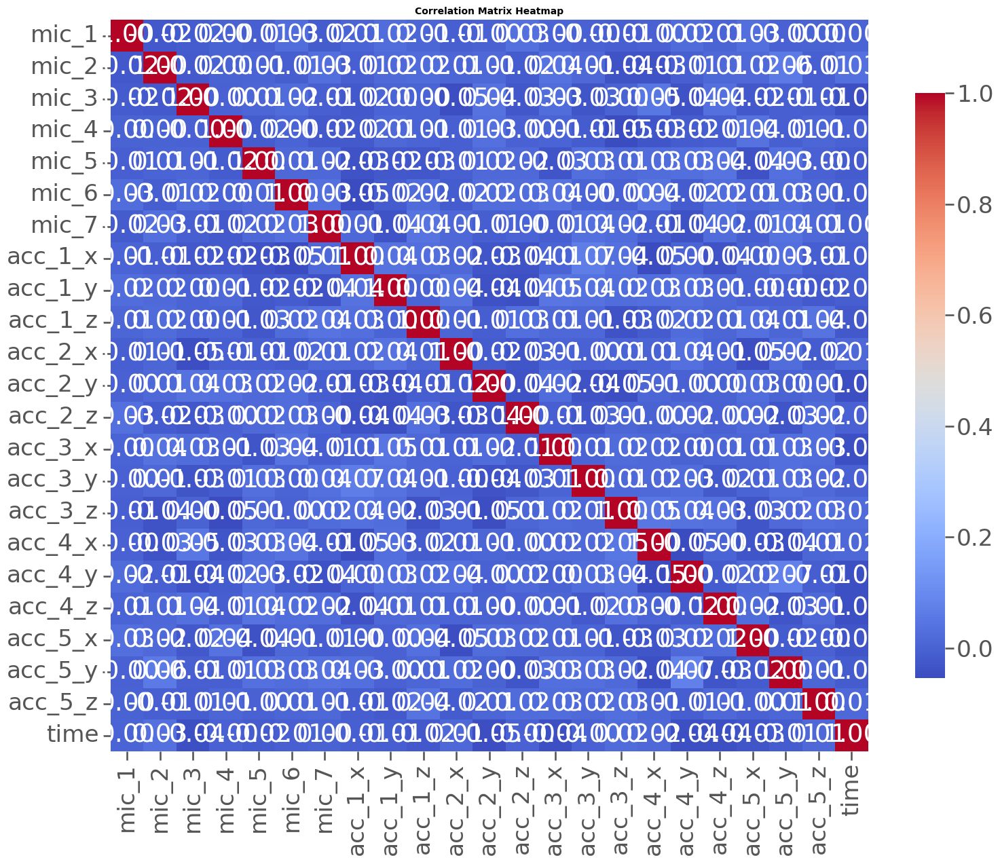

In [14]:
# Correlation Matrix
corr_matrix = df.corr()
plt.figure(figsize=(18, 14))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', cbar_kws={'shrink': 0.8})
plt.title('Correlation Matrix Heatmap', fontsize=10, fontweight='bold')
plt.show()

In [15]:
# Scatter Plot for Highly Correlated Variables
high_corr_features = corr_matrix['mic_1'][corr_matrix['mic_1'].abs() > 0.7].index.tolist()

for feature in high_corr_features:
    if feature != 'mic_1':
        plt.figure(figsize=(10, 8))
        sns.scatterplot(x=df[feature], y=df['mic_1'], color='darkorange', s=60, edgecolor='k')
        plt.title(f'Scatter Plot between mic_1 and {feature}', fontsize=18, fontweight='bold')
        plt.xlabel(f'{feature}')
        plt.ylabel('mic_1')
        plt.grid(True)
        plt.show()
# Save the correlation matrix
corr_matrix.to_csv('correlation_matrix.csv')
corr_matrix

,mic_1,mic_2,mic_3,mic_4,mic_5,mic_6,mic_7,acc_1_x,acc_1_y,acc_1_z,...,acc_3_x,acc_3_y,acc_3_z,acc_4_x,acc_4_y,acc_4_z,acc_5_x,acc_5_y,acc_5_z,time
mic_1,1.000000,-0.024616,-0.017126,0.001633,-0.006950,0.026695,-0.015409,0.006206,0.023955,0.010173,...,0.004468,-0.003128,-0.008302,-0.002279,0.023512,0.005017,0.029229,-0.003268,0.001492,0.003895
mic_2,-0.024616,1.000000,-0.021280,0.002066,0.006663,-0.010137,0.030942,-0.006556,0.019553,0.019792,...,0.036808,0.011591,-0.037676,-0.034925,-0.007256,0.013604,0.017993,0.058617,-0.007485,0.034177
mic_3,-0.017126,-0.021280,1.000000,-0.004866,0.009437,0.022623,-0.005554,-0.023734,0.003273,0.003427,...,0.027704,-0.032069,0.002131,0.051197,-0.035274,0.035089,-0.022464,-0.007018,-0.012963,-0.043005
mic_4,0.001633,0.002066,-0.004866,1.000000,-0.016503,0.004406,-0.020989,-0.017564,0.013138,0.005195,...,0.005381,-0.013508,-0.051809,-0.031824,-0.017321,-0.009843,0.036741,-0.006980,0.008932,-0.003897
mic_5,-0.006950,0.006663,0.009437,-0.016503,1.000000,0.012989,0.015066,-0.034328,-0.022844,-0.027634,...,-0.033314,0.029643,0.014288,0.025770,0.028263,0.042090,-0.040632,0.033812,-0.002712,-0.015268
mic_6,0.026695,-0.010137,0.022623,0.004406,0.012989,1.000000,0.032645,-0.053621,-0.015079,0.020622,...,0.041647,0.004037,-0.003353,0.040588,-0.016532,0.024194,0.012058,0.027402,0.011332,-0.005501
mic_7,-0.015409,0.030942,-0.005554,-0.020989,0.015066,0.032645,1.000000,0.014655,-0.035915,0.042436,...,-0.012230,0.035425,0.023651,-0.011544,-0.039376,0.024187,-0.010561,0.039130,0.013361,0.000206
acc_1_x,0.006206,-0.006556,-0.023734,-0.017564,-0.034328,-0.053621,0.014655,1.000000,0.038916,0.029908,...,0.005787,0.067468,0.035752,-0.051513,0.003370,-0.035114,0.000315,0.028358,-0.010741,-0.005619
acc_1_y,0.023955,0.019553,0.003273,0.013138,-0.022844,-0.015079,-0.035915,0.038916,1.000000,0.003320,...,0.046467,0.040011,0.024177,0.029574,0.032736,0.011535,-0.001020,-0.002779,-0.018830,-0.011665
acc_1_z,0.010173,0.019792,0.003427,0.005195,-0.027634,0.020622,0.042436,0.029908,0.003320,1.000000,...,0.014466,0.014380,-0.034929,-0.016866,0.023368,0.008276,0.036034,0.009703,0.041091,-0.024207


<Figure size 2000x1500 with 0 Axes>

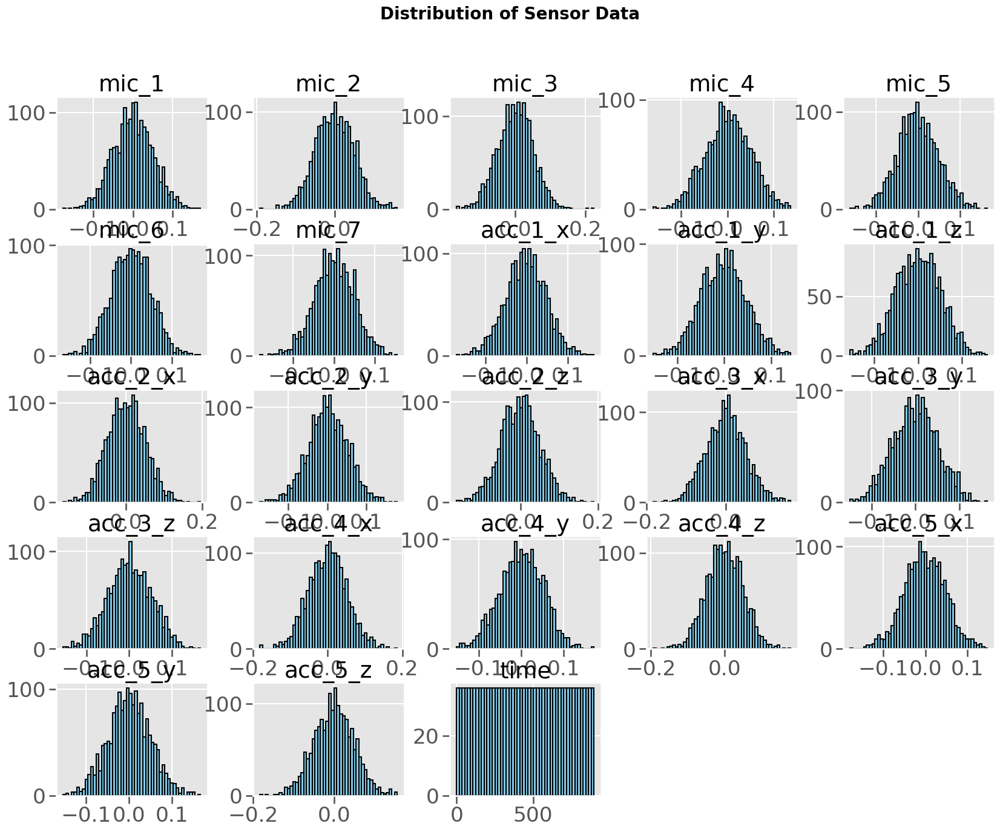

In [16]:

# Exploratory Data Analysis (EDA)
plt.figure(figsize=(20, 15))
df.hist(bins=50, figsize=(20, 15), color='skyblue', edgecolor='black')
plt.suptitle('Distribution of Sensor Data', fontsize=20, fontweight='bold')
plt.show()

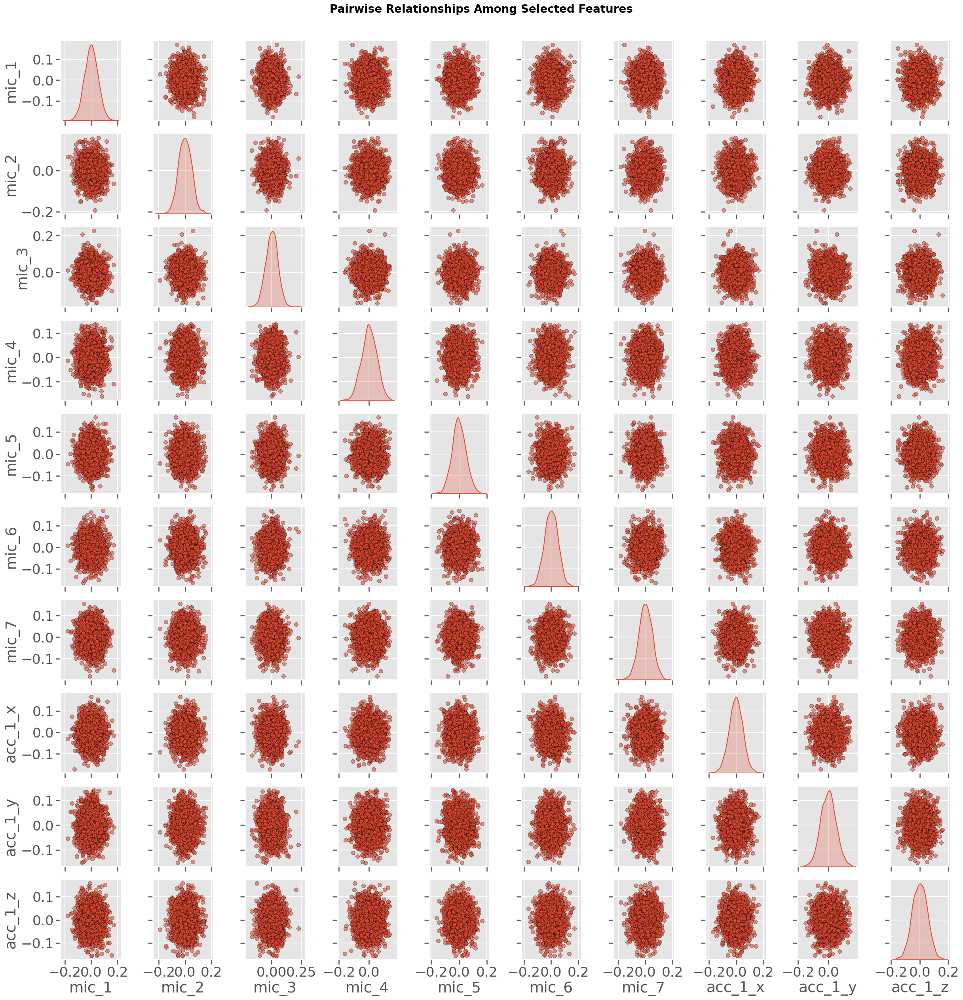

In [17]:
# Pair Plot for selected features
selected_features = df.columns[:10]  # Select first 10 features for visualization
sns.pairplot(df[selected_features], diag_kind='kde', plot_kws={'alpha': 0.6, 's': 50, 'edgecolor': 'k'})
plt.suptitle('Pairwise Relationships Among Selected Features', y=1.02, fontsize=20, fontweight='bold')
plt.show()

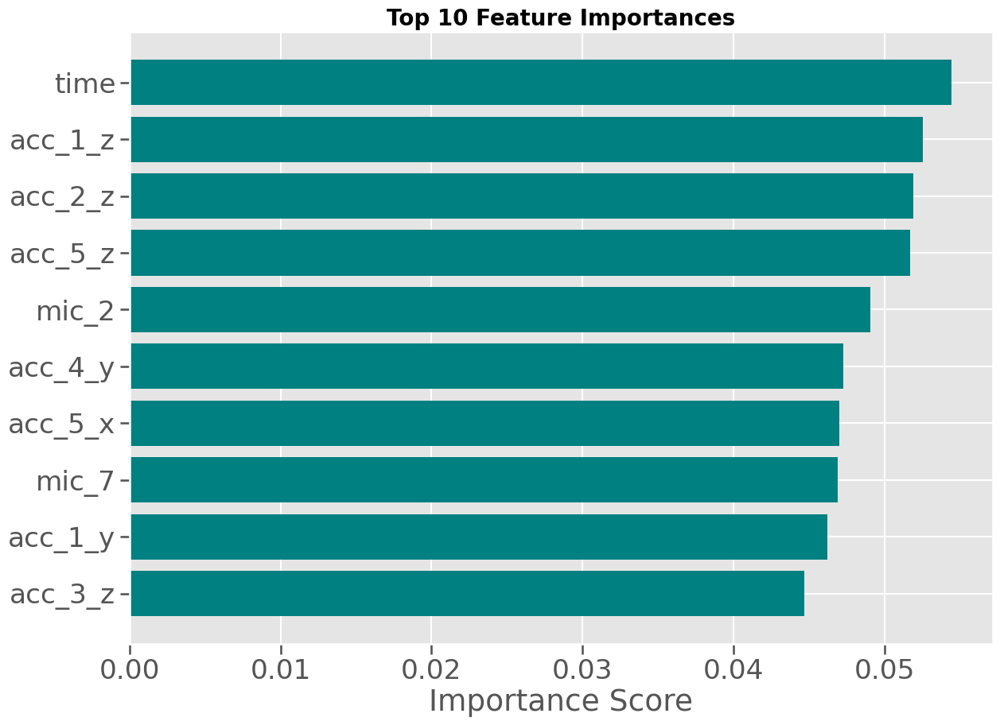

In [18]:
# Variable Importance Analysis using Random Forest
X = df.drop(columns=['mic_1'])  # Assume 'mic_1' as the target for demonstration
y = df['mic_1']

rf = RandomForestRegressor(n_estimators=500, random_state=42)
rf.fit(X, y)

importances = rf.feature_importances_
indices = np.argsort(importances)[::-1]

plt.figure(figsize=(14, 10))
plt.title('Top 10 Feature Importances', fontsize=20, fontweight='bold')
plt.barh(X.columns[indices[:10]], importances[indices[:10]], color='teal')
plt.gca().invert_yaxis()
plt.xlabel('Importance Score')
plt.show()

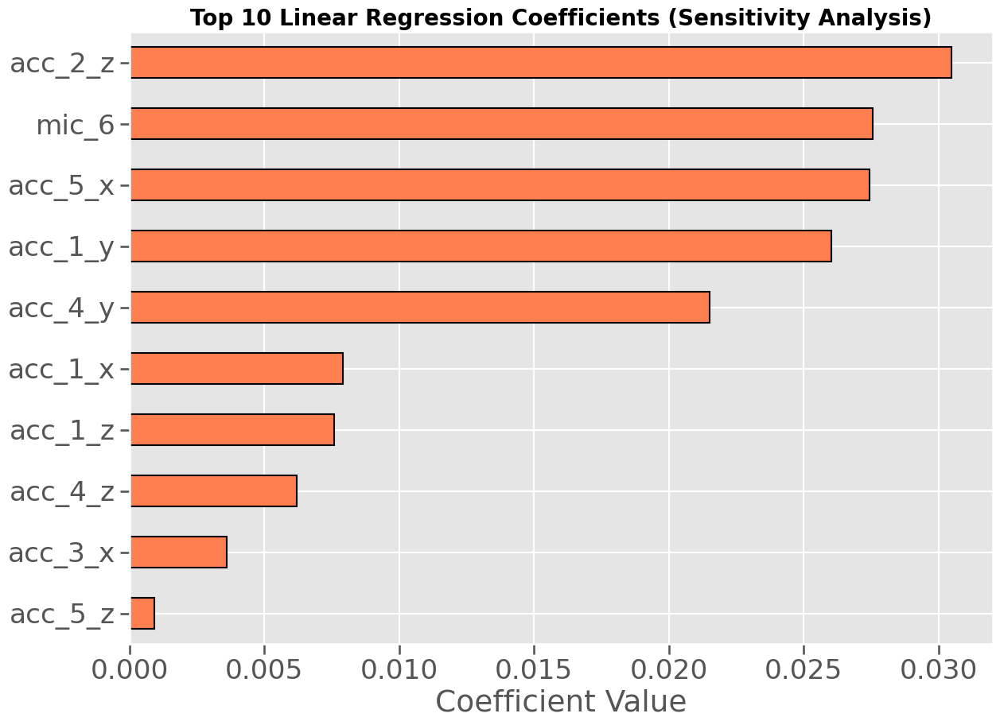

In [19]:
# Linear Regression for Sensitivity Analysis
lin_reg = LinearRegression()
lin_reg.fit(X, y)

# Coefficients and Sensitivity
coefficients = pd.Series(lin_reg.coef_, index=X.columns)
coefficients.sort_values(ascending=False, inplace=True)

plt.figure(figsize=(14, 10))
coefficients.head(10).plot(kind='barh', color='coral', edgecolor='black')
plt.title('Top 10 Linear Regression Coefficients (Sensitivity Analysis)', fontsize=20, fontweight='bold')
plt.xlabel('Coefficient Value')
plt.gca().invert_yaxis()
plt.show()

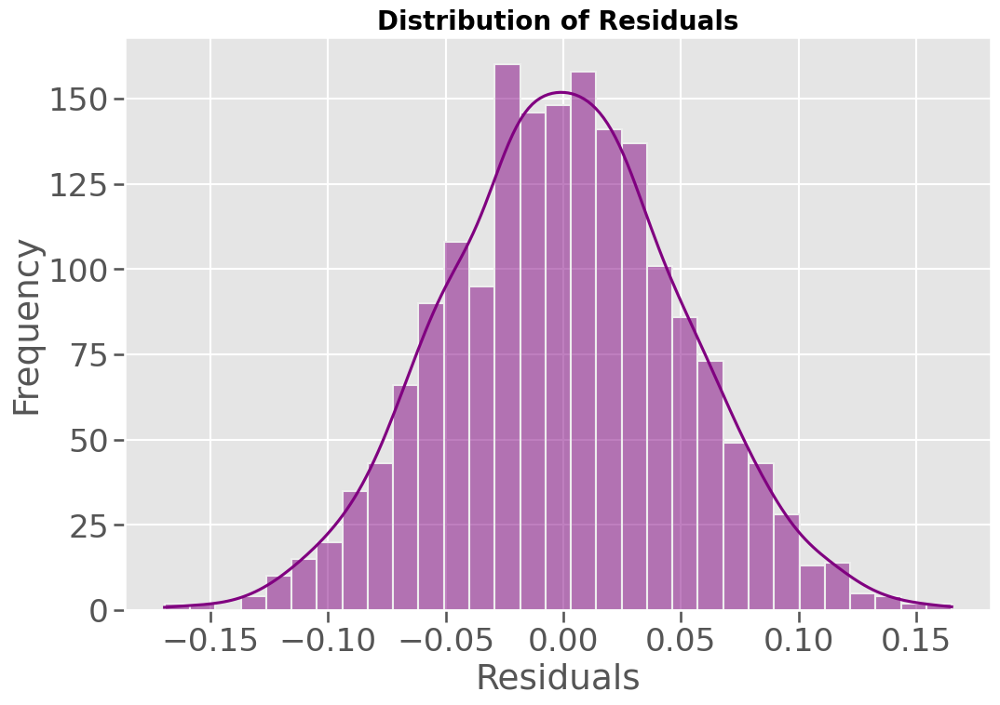

In [20]:

# Normality Test of Residuals
predictions = lin_reg.predict(X)
residuals = y - predictions

plt.figure(figsize=(12, 8))
sns.histplot(residuals, kde=True, color='purple')
plt.title('Distribution of Residuals', fontsize=20, fontweight='bold')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.show()